# Neural Networks for Data Science Applications (2019/2020)

* **Student(s)**: Hamed Asadollahi (1717717), Mousaalreza Dastmard (1852433)
* **Reference paper / topic**: Lehtinen, J., Munkberg, J., Hasselgren, J., Laine, S., Karras, T., Aittala, M., & Aila, T. (2018). Noise2noise: Learning image restoration without clean data. arXiv preprint arXiv:1803.04189.

## Noise2Noise

The kernel is partially implementation of the <a href='https://arxiv.org/pdf/1803.04189.pdf'>article</a> entitled Noise2Noise, The main characteristics pointed out in this article is the ability to train the model only using noisy images rather than clean targets. In general, for purpose of image restoration a set of pairs consist of a corrupted image and clean target are used. Although, this article demonstrates that pairs having both corrupted image as input and target are eligible to feed a neural network and yield the same results. In some case even better results gained.

## Theoretical Background

In statistical data analysis, recently neural network have been piqued researchers intrests. Particularly a regression model like CNN for image restoration doimain. Having pair of inputs $(\hat{x}_i, y_i)$, $\hat{x}_i$ corrupted inputs and $y_i$ clean target, the aim is minimizing the emperical risk:

<div align="center">
  $argmin_{\theta}\sum_{i}{L(f_{\theta}(\hat{x}_i), y_i)}$
</div>

where $f_{\theta}$ is a parametric CNN model under the loss function of $L$. In statistical point of view we are dealing with minimizing the expected loss function:

<div align="center">
  $argmin_{\theta}\mathbb{E}\{{L(z, y)}\}$
</div>

where $z = f_{\theta}(\hat{x})$ and for $L_2$ function $L(z,y) = (z-y)^2$, the minimum foud at arithmetic mean $z = \mathbb{E}\{y\}$ and for $L_1$ the solution is median.

In image restoration using CNN, the general training procedure suggests $z = \mathbb{E}\{y\}$ for $L_2$ function. Which means feading the CNN model with noisy targets $y' = y + e$, where $e$ noises are zero-centered should suggest:

<div align="center">
  $z = \mathbb{E}\{y'\} = \mathbb{E}\{y\} + \mathbb{E}\{e\} = \mathbb{E}\{y\}$
</div>

## Lack of computation power
The paper, draw crops of size 256x256 from tiny image net (contains 50000 images) and set the number of features (filters) in all layer of the CNN model to 128. Using the same settings depicts the need for GPU having at least 8GB dedicated RAM. However such accelerator are available on Kaggle and Colab, but it still takes too much to train every single model. To avoid too much time and computation consumption, we set the setting as below:
1.	change the train set from tiny image net to BSDS300 train
2.	draw crops of size 128x128 instead of 256x256
3.	using 64 filters rather than 128.

## Memory cosumption matters
We are dealing with media files like images that takes too much when we load bunch of them on memory. Handling the memory consumption is tricky and we offer two solution to tackle this problem.
1. tfrecords: each example in the data set can be store as tfrecords file on disk. An example in the this case is a pair of images. We draw a crop from an image, generates noisy samples as many as we want, they convert to bytes, then we pack the pairs of bytes. Each pairs serialized to a string of characters. At the end each string that represented a pair of images can store line by line in tfrecords files. So TensorFlow is familiar with tfrecords, when it needs to feed the model with a specific sample, it reads the sample from the tfrecords and load to the memory. So at a time only those samples are needed or might be need in near future will be loaded on the memory. This method is applicable when we add noise to raw images and need to load them frequently. Generally, adding noise is done once and the model will avoid doing the same task several time.

2. generator: generators are not like tfrecords and they are lazy objects. Each time a generator is called, a bunch of images load in the memory, noise are added and pairs are generated.

In total, both solution do the same but have different applications. tfrecords store the preprocessed data on disk and read them when needed, however generators read the data and preprocess them at the time they are needed. 

## Model - RED30
When it comes to image restoration, it is CNN model always poped up, but with different architacture. The model name is RED300. In the model mainly layers like convelutional and deconvelotional along with adding, average and relu used. All de/convelotional layers have kernel_size = (3,3) and padding = 'same' with 64 filters. The first half of the architacture only consists of conveloutional layers, while the second half have deconvelutinal and average and relu layers. Every 2 adjusent convelotional layers in the first half and 2 adjusent deconvelutional and following average and relu make blocks. Each block from first half is connected through average layer to the coresponding block on the second half. If we represent blocks on first half with $CB$ and blocks on second half with $DB$, then $CB_i$ is connected to $DB_{N-i}$ for $i \in {[0, 1, 2, ..., N-1]}$ , where $N$ is number of blocks on each half.
The picture shows the architecture of the model.

## Datasets
Three datasets are used in this project, BSDS300, Kodak and Set14 which BSDS300 train set is going to be used as train and validation set and BSDS300 test set, Kodak and Set14 are for test phase. The whole data sets store on Kaggle and cab be downloaded on local machine.

In [3]:
# Run this cell only if the kernel is going to run on google colab.
# Mounting the data from Google Drive slow down reading the images. so we prefer to
# store the data on disk rahter than Google Drive 

# You'll be asked to upload your kaggle token in order to be able dowload the datasets on local machine.
from google.colab import files
files.upload()
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mosesdast1","key":"4f258e94496c95c733a0f8dc6624a151"}'}

In [5]:
# Download the datasets
!kaggle datasets download -d mosesdast1/noise2noise

 78% 33.0M/42.5M [00:01<00:00, 13.2MB/s]
100% 42.5M/42.5M [00:01<00:00, 25.9MB/s]


In [0]:
# Unzip the images in datasets. Bingo! ready to use.
# you will see folders BSDS300, Kodak, Set14 and ARIAL.TTF file which is later to be used for generation text noise.
!unzip -q /content/noise2noise.zip

In [142]:
# Import essential packages
import os
import numpy as np
import pandas as pd
from itertools import combinations, permutations # to create pairs from a list of objects
from tqdm.notebook import tqdm   # to have graphical loading bar for loops
import tensorflow as tf
from matplotlib.image import imread
import matplotlib.pyplot as plt
# importing all the required layers 
from tensorflow.keras.layers import Dense, Input, Flatten, Reshape,  concatenate, Average
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, Add, UpSampling2D, MaxPool2D
from tensorflow.keras.models import Model # to create NN model
from tensorflow.keras.utils import plot_model # to plot model
from PIL import Image, ImageDraw # to dealt with images
from PIL import ImageFont # to add text to images
from tensorflow.keras.utils import Sequence # to create genertor
# Check tensorflow version.
print(tf.__version__)
# Set the project directory where unzip folder of datasets is located.
project_dir = 'D:/GitHub/noise2noise/'

2.1.0


In [143]:
# Setting image size and number of filters in CNN layers (Conv2D, Conv2DTranspose).
img_shape = [128, 128, 3]
n_filters = 64

### Functions

Function that turns inputs to byte list that help to store tensors on disk

In [144]:
def _bytes_feature(value):
    # Returns a bytes_list from a string / byte
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy() 
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

Function that serialize the pairs to a string. The string contains the data related to pairs that later can be unpacked to feed the model during train and test phase.

In [145]:
def serialize_example(input_img, output_img):
    feature = {
      'input_img': _bytes_feature(input_img),
      'output_img': _bytes_feature(output_img),
    }
    # Create a Features message using tf.train.Example.
    example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
    return example_proto.SerializeToString()

Pixel on images with 3 channels defines with 8 bytes (dtype = "unit8") that ranges from 0 to 255. The clipping function takes care of those pixels that are out of bound after adding noise.

In [146]:
def clipping(image, origin):
    image[image > 255] = 255
    image[image < 0] = 0
    return image

The function adds zero-centred guassion noise to images. As default the standard deviation set to $\sigma=25$.

In [147]:
def white_noise(image, M):
    row,col,ch = image.shape
    gauss = np.random.normal(0,25,(M,row,col,ch))
    gauss = gauss.reshape(M,row,col,ch)
    noisy = clipping(image + gauss, image)
    return noisy.astype("uint8")

The function adds bernoulli noise to pixels, which mean with probability $p=0.25$ a pixel turns to black pixels or stays unchanged.

In [148]:
def bernoulli_noise(image, M):
    row,col,ch = image.shape
    noisy = []
    for m in range(M):
        mask = np.repeat(np.random.binomial(1, .75, size = img_shape[0:-1]+[1]), 3, axis=2)
        noisy.append(np.array(image*mask))
    return np.array(noisy)

The function adds impulse noise to pixels. It is very similar to bernoulli noise, the main difference is that instead of black pixel a random pixel will be substituted.

In [149]:
def impulse_noise(image, M):
    row,col,ch = image.shape
    noisy = []
    for m in range(M):
        mask = np.repeat(np.random.binomial(1, .75, size = img_shape[0:-1]+[1]), 3, axis=2)
        impuls = np.random.randint(0, 256, size = image.shape).astype("uint8")
        noisy.append(np.array(image*mask + impuls*(1-mask)))
    return np.array(noisy)

The function adds noise with poisson distribution. The poisson parameter $\gamma=30$

In [150]:
def poisson_noise(image, M):
    row,col,ch = image.shape
    noise = np.random.poisson(lam=30,size=(M,row,col,ch)) - 30
    noise = noise.reshape(M,row,col,ch)
    noisy = clipping(image + noise, image)
    return noisy.astype("uint8")

The function puts some random string of letters with random colour arbitrarily. 

In [151]:
def text_noise(image, M):
    noisy = []
    for m in range(M):
        img = Image.fromarray(image)
        d = ImageDraw.Draw(img)
        for i in range(20):
            text = "".join(np.array(list(map(chr, range(65,123))))[np.random.randint(0,58,30)])
            font = ImageFont.truetype("ARIAL.TTF", np.random.randint(8,10,1)[0])
            d.text(tuple(np.random.randint(0,128,2)), text, fill=tuple(np.random.randint(0,256,3)), font = font)
        noisy.append(np.array(img))
    return np.array(noisy)

## Noise Examples

Taking an image of butterfly as clean image sample

In [152]:
image = imread("D:/GitHub/noise2noise/Set14/test/monarch.bmp")[70:470,170:570,]
image = tf.image.resize(image, img_shape[0:-1]).numpy().astype("uint8")

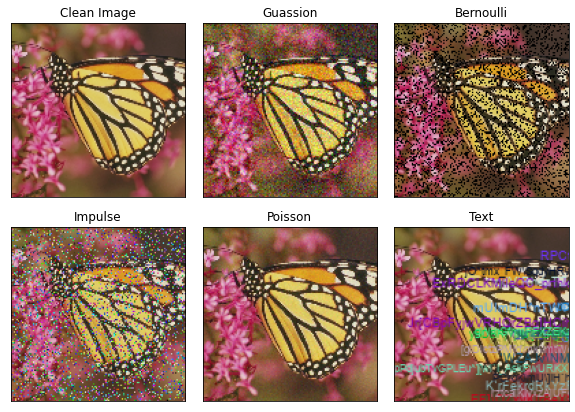

In [153]:
fig, axs = plt.subplots(2, 3, figsize = (10, 10))

axs[0, 0].imshow(image)
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])
axs[0, 0].set_title('Clean Image')

axs[0, 1].imshow(white_noise(image, 1)[0])
axs[0, 1].set_xticks([])
axs[0, 1].set_yticks([])
axs[0, 1].set_title('Guassion')

axs[0, 2].imshow(bernoulli_noise(image, 1)[0])
axs[0, 2].set_xticks([])
axs[0, 2].set_yticks([])
axs[0, 2].set_title('Bernoulli')

axs[1, 0].imshow(impulse_noise(image, 1)[0])
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])
axs[1, 0].set_title('Impulse')

axs[1, 1].imshow(poisson_noise(image, 1)[0])
axs[1, 1].set_xticks([])
axs[1, 1].set_yticks([])
axs[1, 1].set_title('Poisson')

axs[1, 2].imshow(text_noise(image, 1)[0])
axs[1, 2].set_xticks([])
axs[1, 2].set_yticks([])
axs[1, 2].set_title('Text');
plt.subplots_adjust(wspace=0.1, hspace=-.4)

We need to take control of the probability that a random pixel is valid or replaced by a text-related one.

In [154]:
## Probability of a pixel substituted by a text noise
print("The probability of a pixel is replaced: ", (image != text_noise(image, 1)[0]).sum()/3/128/128)

The probability of a pixel is replaced:  0.3041178385416667


The mapper function takes an image path and generates several pairs eigther with clean target or noisy target.

In [168]:
def mapper(image_path, M, noiser, permute = True):
    image = imread(image_path, format='bmp')
    try:
        image = tf.image.random_crop(image, size=img_shape).numpy()
        noisy = noiser(image, M)
        noisy = noisy/255
        captures = list(noisy)
        if permute:
            pairs = list(permutations(captures,2))
        else:
            pairs = [[inp, image/255] for inp in captures]
        return pairs
    except:
        return []

The function only cares if a arbitrary path belongs to an image file.

In [156]:
def filter_images(images_dir):
    return [images_dir + "/" + image_name for image_name in os.listdir(images_dir) if any([image_name.endswith(x) for x in ['.jpg','.png','.jpeg','.JPG','.PNG','.JPEG','.bmp','.BMP']])]

In [157]:
def gen_tfrecords(images_dir, M, noiser, name, prefix , mode, force_gen = False, clean_target = False):
    pairs_n = 0
    output_path = name + "_" + mode + "_" + prefix + ".tfrecords"
    images_path = filter_images(images_dir)
    if (force_gen == False) and (os.path.exists(output_path) == True):
        return output_path
    if os.path.exists(output_path):
        os.remove(output_path)
    with tf.io.TFRecordWriter(output_path) as writer:
        for image_path in tqdm(images_path):
            pairs =  mapper(image_path,M, noiser, permute=((mode=='train') & (not clean_target)))
            serialized_examples = list(map(lambda x: serialize_example(tf.io.serialize_tensor(x[0]), tf.io.serialize_tensor(x[1])), pairs))
            for serialized_example in serialized_examples:
                writer.write(serialized_example)
                pairs_n += 1
    print("{} pairs are generated".format(pairs_n))
    return output_path

In [158]:
class Generator(Sequence):
    def __init__(self, images_dir, batch_size, noiser):
        self.noiser = noiser
        self.images_dir = images_dir
        self.batch_size = batch_size
        self.chunks = list(chunks(filter_images(images_dir), batch_size))
    def __len__(self):
        return len(self.chunks)
    def __getitem__(self, index):
        images_path = self.chunks[index]
        inp = []
        out = []
        for image_path in images_path:
            pairs =  mapper(image_path,2, self.noiser, permute= True)
            try:
                for pair in pairs:
                    inp.append(pair[0])
                    out.append(pair[1])
            except:
                pass
        return np.array(inp), np.array(out)

### Create tfrecords
For every type of noise we generate train (on BSDS300 train set), validation (on BSDS300 train set) and test (on BSDS300 test set, Kodak, Set14) sets for both noisy target and clean target.
We generate 4000 samples for train and about 200 to 400 samples for test and validation.

In [160]:
ReGen = True
train_dir  = project_dir + "BSDS300/train"
valid_dir  = project_dir + "BSDS300/train"
t_dir_BSD  = project_dir + "BSDS300/test"
t_dir_KDK  = project_dir + "Kodak/Test"
t_dir_S14  = project_dir + "Set14/test"

In [33]:
train_path = gen_tfrecords(train_dir, 20, white_noise, name = "BSD300", prefix='white', mode = 'train', force_gen=ReGen, clean_target = True)
valid_path = gen_tfrecords(valid_dir, 2,  white_noise, name = "BSD300", prefix='white', mode = 'valid', force_gen=ReGen)
t_BSD_path = gen_tfrecords(t_dir_BSD, 2,  white_noise, name = "BSD300", prefix='white', mode = 'test' , force_gen=ReGen)
t_KDK_path = gen_tfrecords(t_dir_KDK, 8,  white_noise, name = "Kodak",  prefix='white', mode = 'test' , force_gen=ReGen)
t_S14_path = gen_tfrecords(t_dir_S14, 13, white_noise, name = "Set14",  prefix='white', mode = 'test' , force_gen=ReGen)


4000 pairs are generated



400 pairs are generated



200 pairs are generated



200 pairs are generated



169 pairs are generated


In [89]:
kernel_size = (3,3)
inp = Input(shape=img_shape)
c1 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c1')(inp)
c2 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c2')(c1)
# print(c2.shape)
c3 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c3')(c2)
c4 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c4')(c3)
# print(c4.shape)
c5 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c5')(c4)
c6 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c6')(c5)
# print(c6.shape)
c7 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c7')(c6)
c8 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c8')(c7)
# print(c8.shape)
c9 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c9')(c8)
c10 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c10')(c9)
# print(c10.shape)
c11 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c11')(c10)
c12 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c12')(c11)
# print(c12.shape)
c13 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c13')(c12)
c14 = Conv2D(filters=n_filters, kernel_size=(3,3), padding = 'same', name='c14')(c13)
# print(c14.shape)


d1 = Conv2DTranspose(n_filters, kernel_size=(3,3), padding = 'same', name = 'd1')(c14)
d2 = Conv2DTranspose(n_filters, kernel_size=(3,3), padding = 'same', name = 'd2')(d1)
# print(d2.shape)
add1 = Average()([d2, c12])
# add1 = Add()([d2, c12])
# print(add1.shape)
rl1 = tf.keras.layers.ReLU(1)(add1)
d3 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd3')(rl1)
d4 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd4')(d3)
# print(d4.shape)
add2 = Average()([d4, c10])
# add2 = Add()([d4, c10])
# print(add2.shape)
rl2 = tf.keras.layers.ReLU(1)(add2)

d5 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd5')(rl2)
d6 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd6')(d5)
# print(d6.shape)
add3 = Average()([d6, c8])
# add3 = Add()([d6, c8])
# print(add3.shape)
rl3 = tf.keras.layers.ReLU(1)(add3)

d7 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd7')(rl3)
d8 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd8')(d7)
# print(d8.shape)
add4 = Average()([d8, c6])
# add4 = Add()([d8, c6])
# print(add4.shape)
rl4 = tf.keras.layers.ReLU(1)(add4)

d9 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd9')(rl4)
d10 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd10')(d9)
# print(d10.shape)
add5 = Average()([d10, c4])
# add5 = Add()([d10, c4])
# print(add5.shape)
rl5 = tf.keras.layers.ReLU(1)(add5)

d11 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd11')(rl5)
d12 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd12')(d11)
# print(d12.shape)
add6 = Average()([d12, c2])
# add6 = Add()([d12, c2])
# print(add6.shape)
rl6 = tf.keras.layers.ReLU(1)(add6)

d13 = Conv2DTranspose(n_filters, kernel_size=(3,3),  padding = 'same', name = 'd13')(rl6)
d14 = Conv2DTranspose(3, kernel_size=(3,3),  padding = 'same', name = 'd14')(d13)
# print(d14.shape)
add7 = Average()([d14, inp])
# add7 = Add()([d14, inp])
# print(add7.shape)
rl7 = tf.keras.layers.ReLU(1)(add7)

model_red30 = Model(inputs = inp, outputs = rl7)

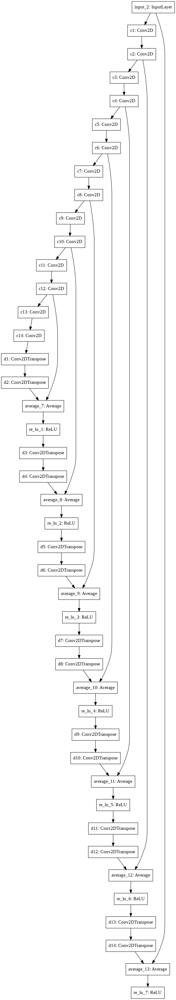

In [58]:
plot_model(model_red30)

The model summary shows there are about 1 milion trainable parameters and 30 trainable layers.

In [90]:
print(model_red30.summary())

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
c1 (Conv2D)                     (None, 128, 128, 64) 1792        input_4[0][0]                    
__________________________________________________________________________________________________
c2 (Conv2D)                     (None, 128, 128, 64) 36928       c1[0][0]                         
__________________________________________________________________________________________________
c3 (Conv2D)                     (None, 128, 128, 64) 36928       c2[0][0]                         
____________________________________________________________________________________________

Previousely we have store the samples on tfrecords files. Here we only define where the files are located on the disk.

In [0]:
tfrecord_valid = tf.data.TFRecordDataset(valid_path)
tfrecord_train = tf.data.TFRecordDataset(train_path)

tfrecords stores the samples as serilized strings. we need a function to decode the strings and grab the images.

In [162]:
def read_tfrecord(serialized_example):
    feature_description = {
        'input_img': tf.io.FixedLenFeature((), tf.string),
        'output_img': tf.io.FixedLenFeature((), tf.string),
    }
    example = tf.io.parse_single_example(serialized_example, feature_description)
  
    input_img = tf.reshape(tf.io.parse_tensor(example['input_img'], out_type = tf.float64), img_shape)
    output_img = tf.reshape(tf.io.parse_tensor(example['output_img'], out_type = tf.float64), img_shape)

    return input_img, output_img

We need to map the read_tfrecord function to every single line of tfrecords files and shuffle them in order not letting pairs related to same image put in the same batch, then we make batch of 32 samples to feed the network.  

In [163]:
valid = tfrecord_valid.map(read_tfrecord).shuffle(1).batch(32)
train = tfrecord_train.map(read_tfrecord).shuffle(1).batch(32)

NameError: name 'tfrecord_valid' is not defined

PSNR is a well-known metrics when it comes to image restoration, the higher PSNR the better image restoration.

In [164]:
def PSNR(y_true,y_pred):
    return tf.image.psnr(y_true, y_pred, 1)

### Gradian vanishing
When we are using mean of square error as loss function in case of bernoulli noise, it is possible for some positions pixel related to input image and output image are both set to black with all zero values over 3 channels that result in gradian vanishing. In order to avoid gradian vanishing we define a mask on loss function to not consider the error when a pixel on target image has zero values.

In [165]:
def bernoulli_loss(y_true, y_pred):
    mask = tf.math.sign(y_true)
    return tf.reduce_sum(mask*(y_true - y_pred)**2)/tf.reduce_sum(mask)

create a folder and save model weights and the log every epoch, this abales stop/resume the training.

In [0]:
!rm -rf model_red30_white_noisy_target

In [0]:
# !mkdir model_red30_white_noisy_target
model_folder = "model_red30_white_noisy_target"
if len(os.listdir(model_folder)) > 0:
    initial_epoch = int(sorted(os.listdir(model_folder))[-2].split('-')[-1].split('.')[0])
    model = tf.keras.models.load_model(model_folder + "/" + sorted(os.listdir(model_folder))[-2], custom_objects={'PSNR': PSNR})
else:
    initial_epoch = 0
    model = model_red30
    model.compile(loss='mean_squared_error',
                  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001, beta_1 = 0.9, 
                                                                               beta_2=.99, epsilon=10e-8),
                  metrics=[PSNR])

model_file_save = model_folder + "/saved-model-{epoch:03d}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(model_file_save, verbose=1, save_best_only=False)
from tensorflow.keras.callbacks import CSVLogger
csv_logger = CSVLogger(model_folder + "/red30_white_history_log.csv", append=True)
max_epoch = 50

In [69]:
epoch = min([max_epoch, initial_epoch + 100])
print(initial_epoch, epoch)

24 50


## Fitting

In [0]:
history_red30 = model.fit(train,
                          validation_data=valid,
                          epochs=epoch,
                          callbacks=[checkpoint, csv_logger], initial_epoch=initial_epoch)

Epoch 25/50
    125/Unknown - 114s 913ms/step - loss: 0.0012 - PSNR: 29.4546
Epoch 00025: saving model to model_red30_white_noisy_target/saved-model-025.hdf5
125/125 [==============================] - 119s 949ms/step - loss: 0.0012 - PSNR: 29.4546 - val_loss: 0.0013 - val_PSNR: 29.3808
Epoch 26/50
 49/125 [==========>...................] - ETA: 1:07 - loss: 0.0013 - PSNR: 29.3986

## Experimental evaluation
We train the model for every noise twice. One with clean targets and another with noisy targets. So in total we trained the model for 10 times.
Gaussian:
We got almost the same results like the results taken in the paper, both model with clean and noisy perform well on all datasets.
Poisson:
We got poor results for clean images, the reason was we didn't normalize the noises, so even with clean targets the model fails to restore the image well and we got dark images in comparison with true image.
For model with noisy images, we got better results than what was reported on the paper. The difference is not truely comparble since we have used model with less trainable parameter.
Bernoulli:
The results are almost the same as what reported on the paper. Both for clean and noisy targets the models performs very well.
Impulse:
The result for clean targets shows good performance of the model, but using the noisy target we got significant decrease in model performance. The reason for poor results is impulse noises are not zero-centered.
Text:
For text noise the model during training phase converge in initail epoches, and we didn't get noticeble results. It might be stem from the fact that we did'nt train the model with real large data set and using the smaller version of the RED30. Also text noises are not zero-centred.



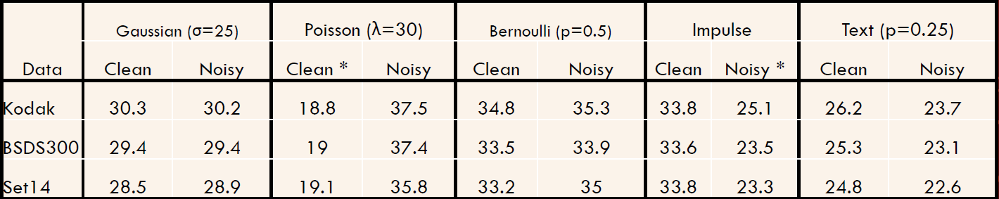

Detailed results are reported below for every model.

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model Bernoulli with cleantarget loaded
     50/Unknown - 13s 260ms/step - loss: 6.4234e-04 - PSNR: 33.5259
model evaluated on BSDS300: [0.000642338600155199, 33.525898]
     50/Unknown - 12s 244ms/step - loss: 4.3528e-04 - PSNR: 34.7695
model evaluated on Kodak: [0.0004352798240142874, 34.769466]
     43/Unknown - 10s 243ms/step - loss: 5.5225e-04 - PSNR: 33.1786
model evaluated on Set14: [0.0005522509464902024, 33.17858]
sample example on BSDS300 test set --------------------------------------------------


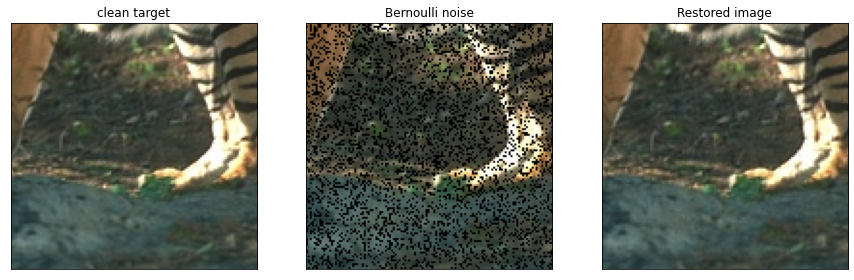

sample example on Kodak test set --------------------------------------------------


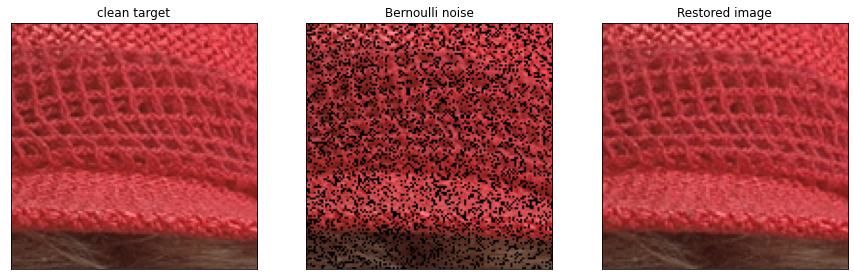

sample example on Set14 test set --------------------------------------------------


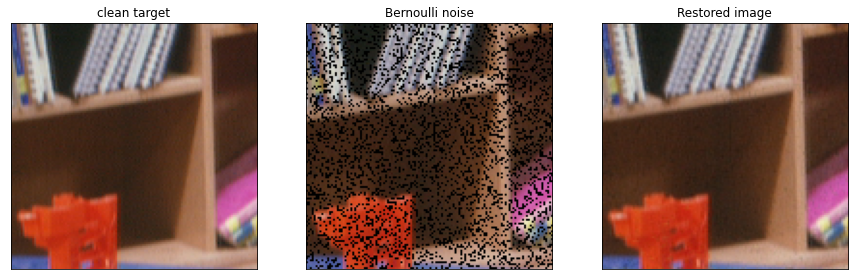

history is loaded


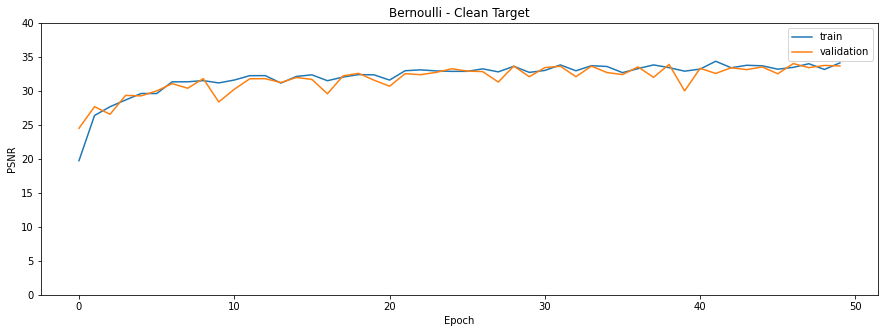

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model Bernoulli with noisytarget loaded
     50/Unknown - 13s 265ms/step - loss: 5.9552e-04 - PSNR: 33.9148
model evaluated on BSDS300: [0.000595521877403371, 33.9148]
     50/Unknown - 12s 245ms/step - loss: 3.7155e-04 - PSNR: 35.2908
model evaluated on Kodak: [0.0003715489565365715, 35.290768]
     43/Unknown - 11s 246ms/step - loss: 4.7649e-04 - PSNR: 34.9798
model evaluated on Set14: [0.0004764942874993891, 34.97976]
sample example on BSDS300 test set --------------------------------------------------


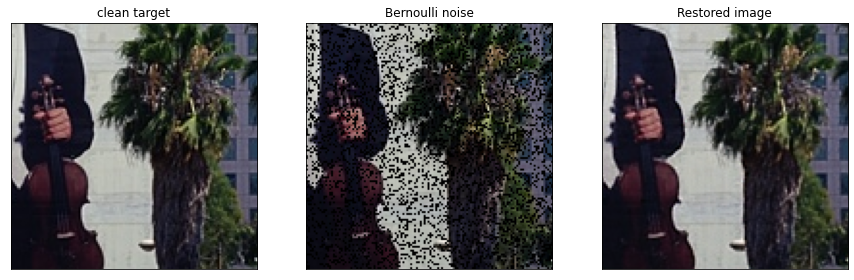

sample example on Kodak test set --------------------------------------------------


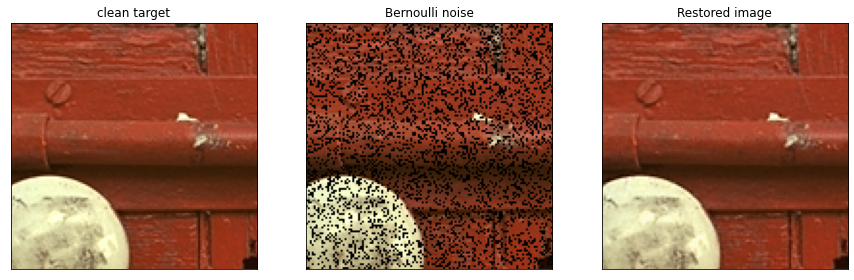

sample example on Set14 test set --------------------------------------------------


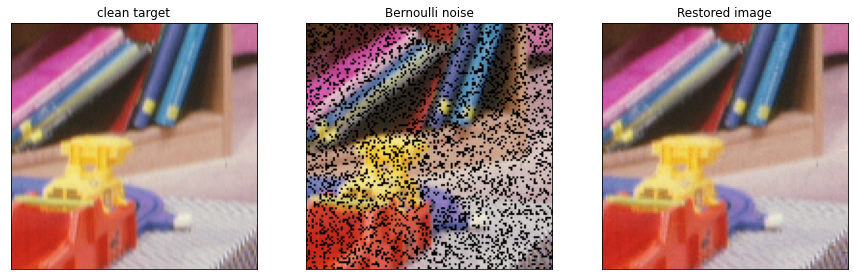

history is loaded


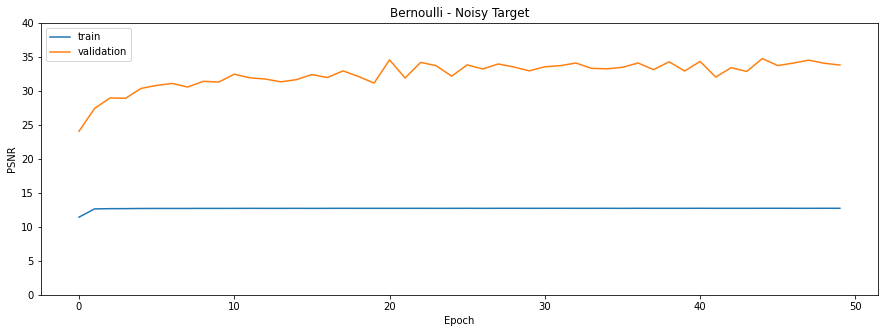

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model Impulse with cleantarget loaded
     50/Unknown - 13s 263ms/step - loss: 6.5808e-04 - PSNR: 33.6340
model evaluated on BSDS300: [0.0006580766380648129, 33.634003]
     50/Unknown - 13s 252ms/step - loss: 6.0653e-04 - PSNR: 33.7910
model evaluated on Kodak: [0.0006065345111710485, 33.79101]
     43/Unknown - 11s 245ms/step - loss: 6.1757e-04 - PSNR: 33.7794
model evaluated on Set14: [0.0006175718874654321, 33.77942]
sample example on BSDS300 test set --------------------------------------------------


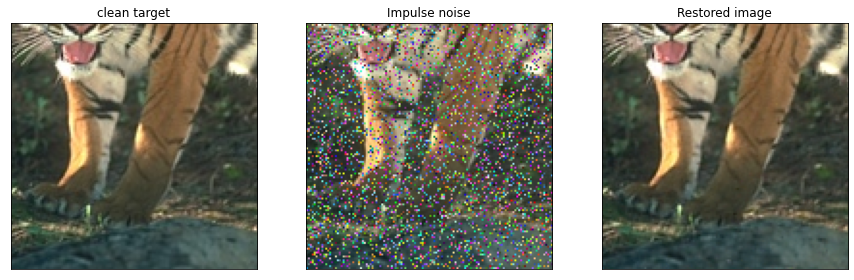

sample example on Kodak test set --------------------------------------------------


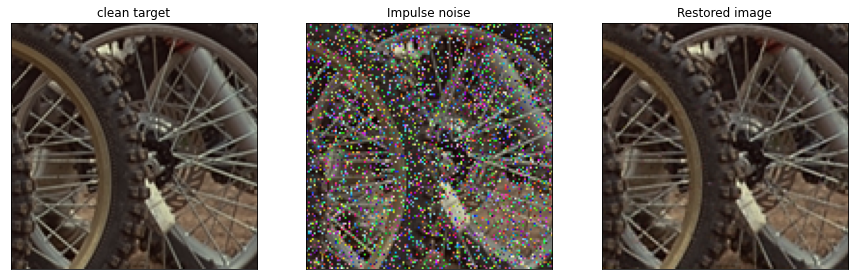

sample example on Set14 test set --------------------------------------------------


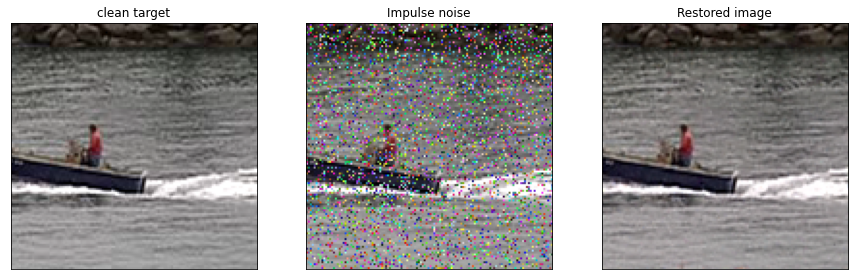

history is loaded


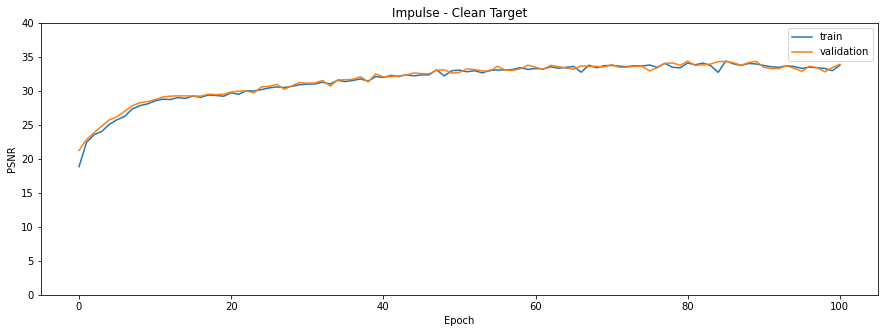

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model Impulse with noisytarget loaded
     50/Unknown - 13s 262ms/step - loss: 0.0051 - PSNR: 23.4614
model evaluated on BSDS300: [0.005077572241425514, 23.461433]
     50/Unknown - 12s 245ms/step - loss: 0.0042 - PSNR: 25.0777
model evaluated on Kodak: [0.004234896656416822, 25.07774]
     43/Unknown - 11s 246ms/step - loss: 0.0051 - PSNR: 23.2905
model evaluated on Set14: [0.0050765955766533, 23.290451]
sample example on BSDS300 test set --------------------------------------------------


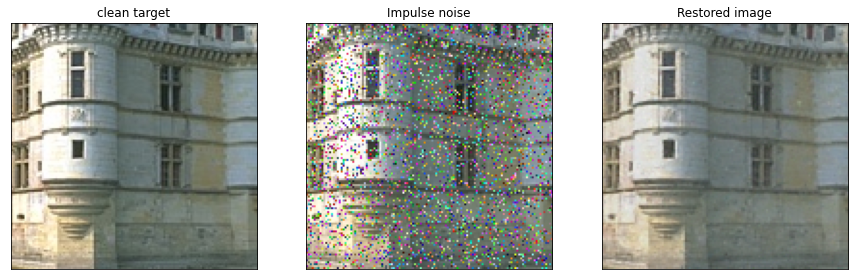

sample example on Kodak test set --------------------------------------------------


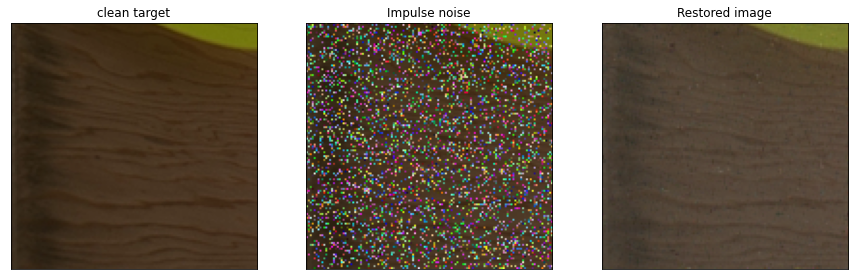

sample example on Set14 test set --------------------------------------------------


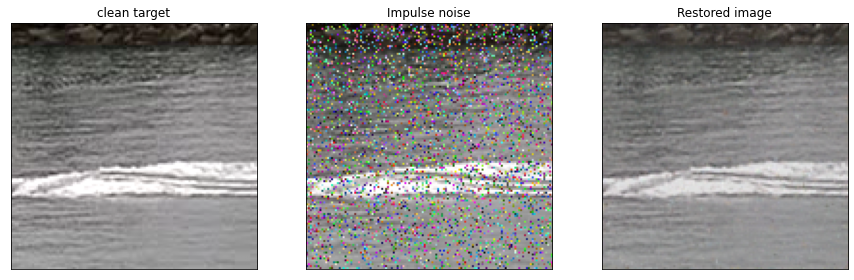

history is loaded


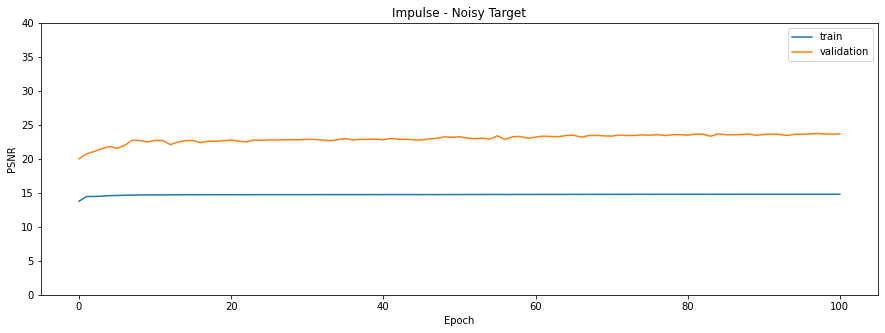

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model Poisson with cleantarget loaded
     50/Unknown - 13s 266ms/step - loss: 0.0128 - PSNR: 18.9829
model evaluated on BSDS300: [0.012797323502600193, 18.982895]
     50/Unknown - 12s 247ms/step - loss: 0.0131 - PSNR: 18.8372
model evaluated on Kodak: [0.0131341421790421, 18.837238]
     43/Unknown - 11s 244ms/step - loss: 0.0125 - PSNR: 19.0812
model evaluated on Set14: [0.012460346420317195, 19.081242]
sample example on BSDS300 test set --------------------------------------------------


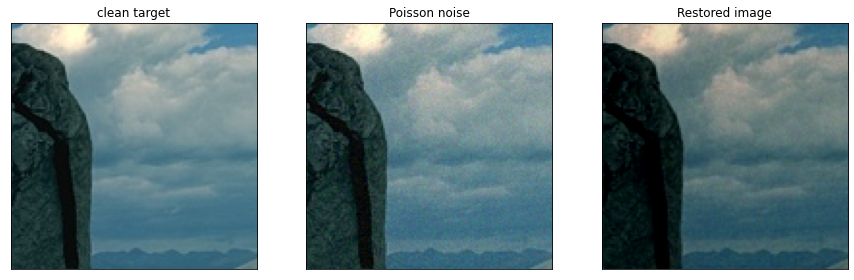

sample example on Kodak test set --------------------------------------------------


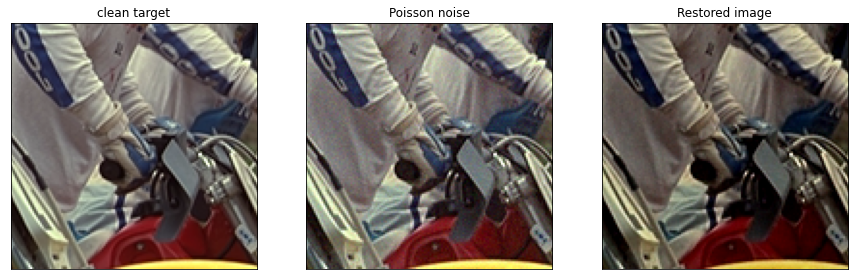

sample example on Set14 test set --------------------------------------------------


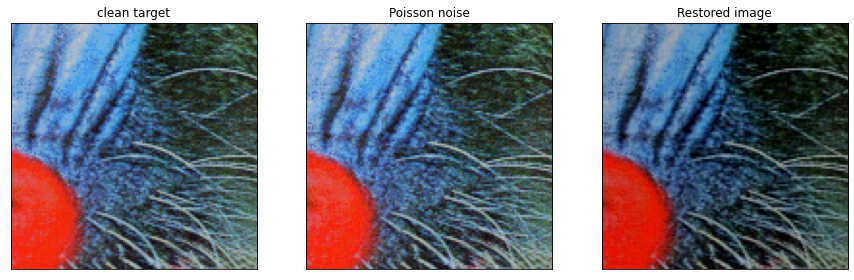

history is loaded


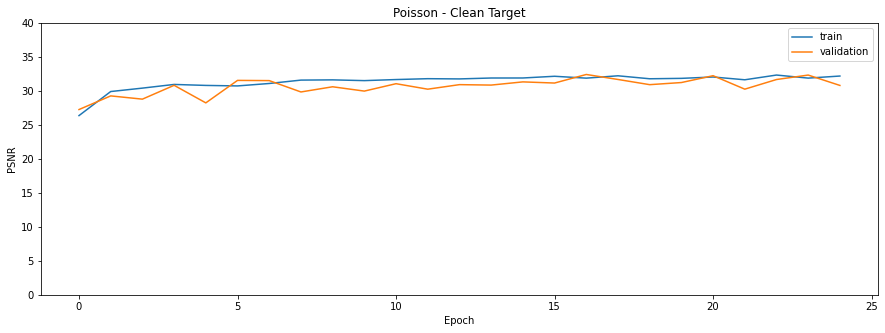

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model Poisson with noisytarget loaded
     50/Unknown - 13s 263ms/step - loss: 1.8882e-04 - PSNR: 37.3557
model evaluated on BSDS300: [0.00018882273841882124, 37.355713]
     50/Unknown - 12s 248ms/step - loss: 1.8115e-04 - PSNR: 37.4971
model evaluated on Kodak: [0.00018114600912667812, 37.497135]
     43/Unknown - 11s 244ms/step - loss: 2.9927e-04 - PSNR: 35.8102
model evaluated on Set14: [0.0002992663489855003, 35.81015]
sample example on BSDS300 test set --------------------------------------------------


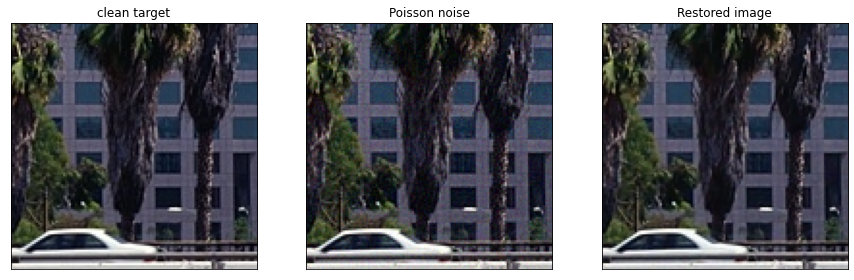

sample example on Kodak test set --------------------------------------------------


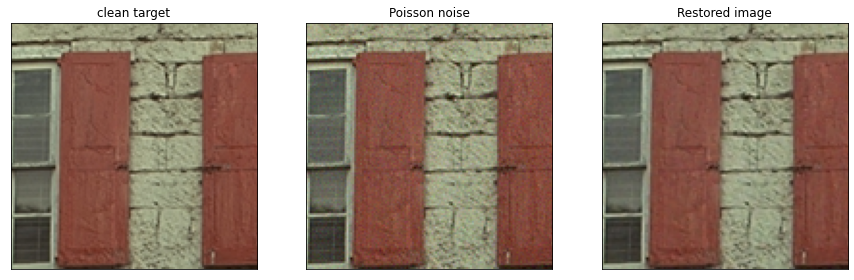

sample example on Set14 test set --------------------------------------------------


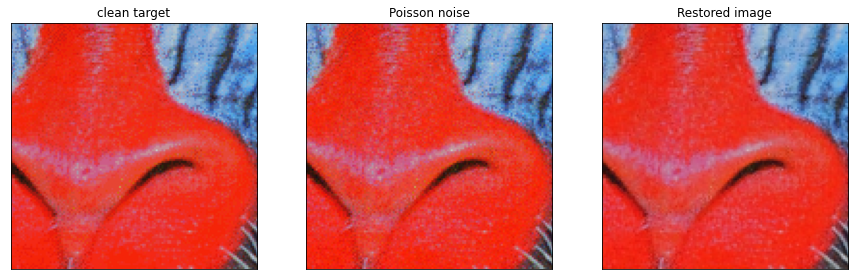

history is loaded


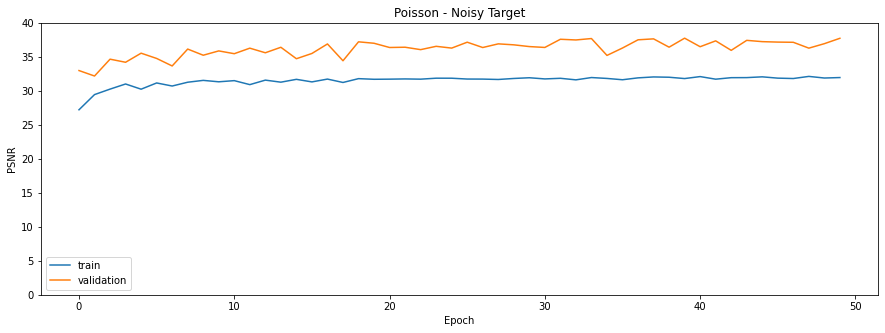

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model Text with cleantarget loaded
     50/Unknown - 13s 262ms/step - loss: 0.0032 - PSNR: 25.3313
model evaluated on BSDS300: [0.00319524341262877, 25.331305]
     50/Unknown - 12s 245ms/step - loss: 0.0027 - PSNR: 26.2195
model evaluated on Kodak: [0.0026711549679748715, 26.219528]
     43/Unknown - 10s 242ms/step - loss: 0.0035 - PSNR: 24.8267
model evaluated on Set14: [0.0035242811847088296, 24.826715]
sample example on BSDS300 test set --------------------------------------------------


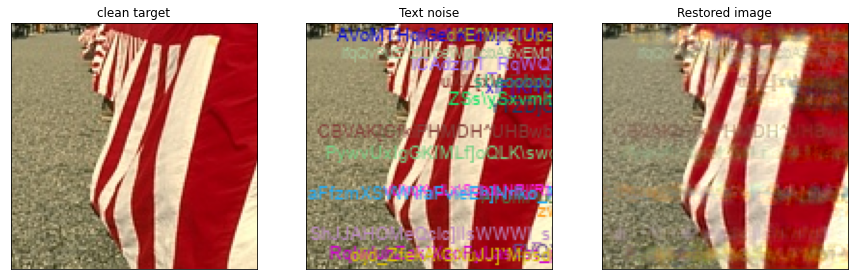

sample example on Kodak test set --------------------------------------------------


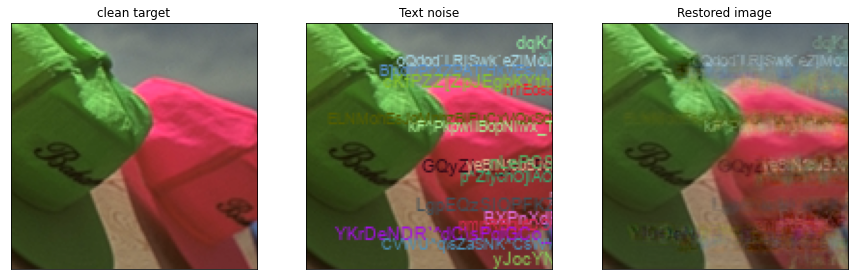

sample example on Set14 test set --------------------------------------------------


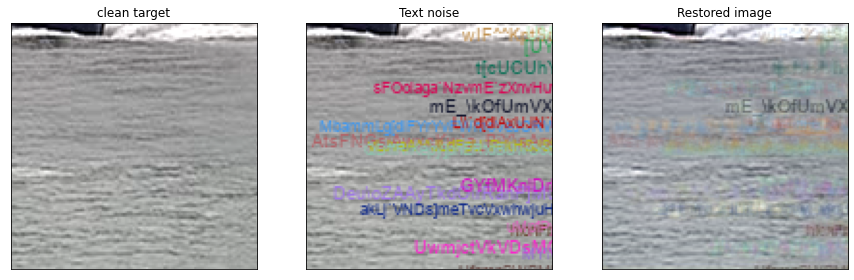

history is loaded


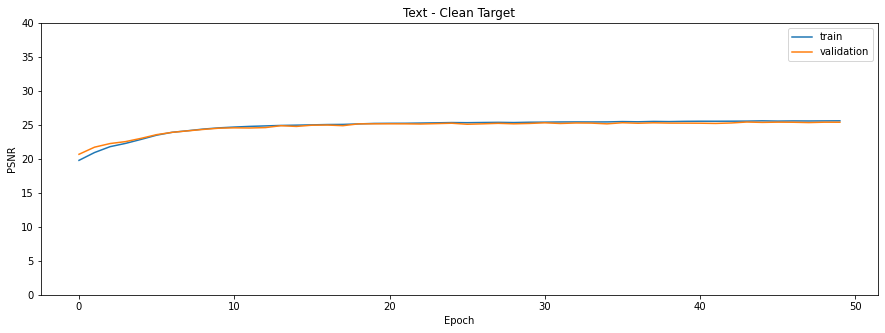

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
No model file is found
history is loaded


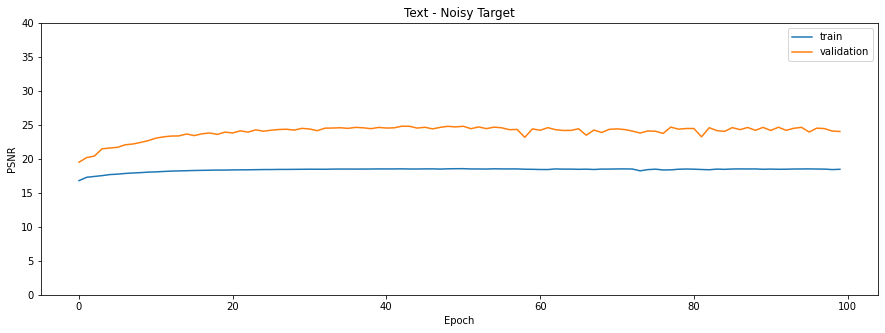

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model White with cleantarget loaded
     50/Unknown - 13s 263ms/step - loss: 0.0013 - PSNR: 29.3862
model evaluated on BSDS300: [0.0012923179939389228, 29.386223]
     50/Unknown - 12s 245ms/step - loss: 0.0010 - PSNR: 30.3493
model evaluated on Kodak: [0.0010276023769984022, 30.34935]
     43/Unknown - 10s 241ms/step - loss: 0.0016 - PSNR: 28.5255
model evaluated on Set14: [0.0015924983904263828, 28.525454]
sample example on BSDS300 test set --------------------------------------------------


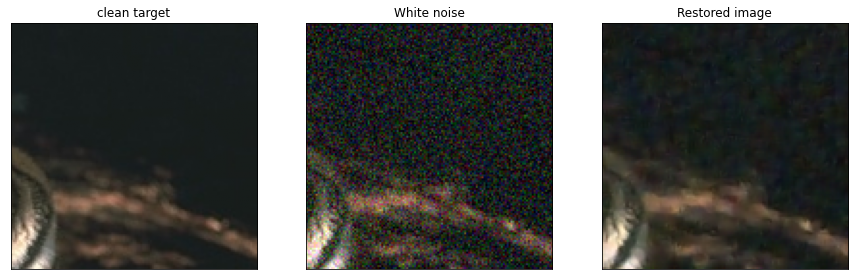

sample example on Kodak test set --------------------------------------------------


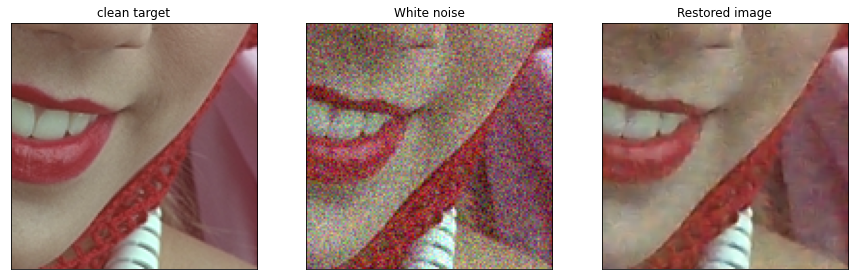

sample example on Set14 test set --------------------------------------------------


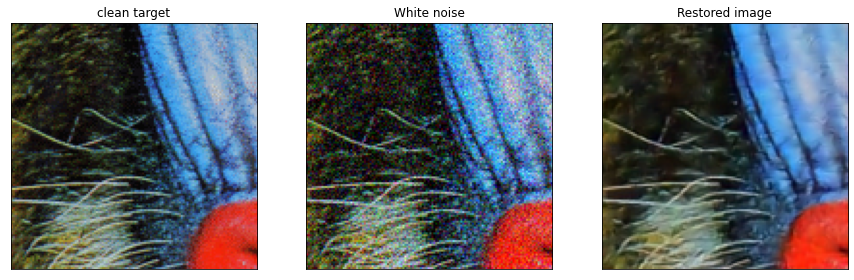

history is loaded


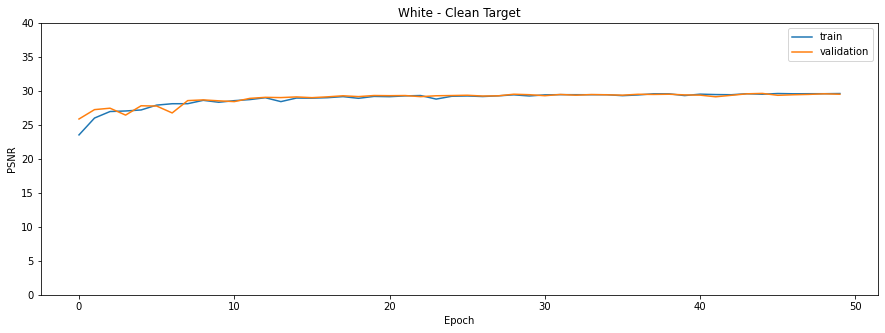

############################################################################



200 pairs are generated



200 pairs are generated



169 pairs are generated
model White with cleantarget loaded
     50/Unknown - 13s 264ms/step - loss: 0.0013 - PSNR: 29.4161
model evaluated on BSDS300: [0.0012586189049761743, 29.416111]
     50/Unknown - 12s 246ms/step - loss: 0.0010 - PSNR: 30.1701
model evaluated on Kodak: [0.0010360021446831525, 30.170143]
     43/Unknown - 10s 243ms/step - loss: 0.0014 - PSNR: 28.9339
model evaluated on Set14: [0.0014418463133340485, 28.933912]
sample example on BSDS300 test set --------------------------------------------------


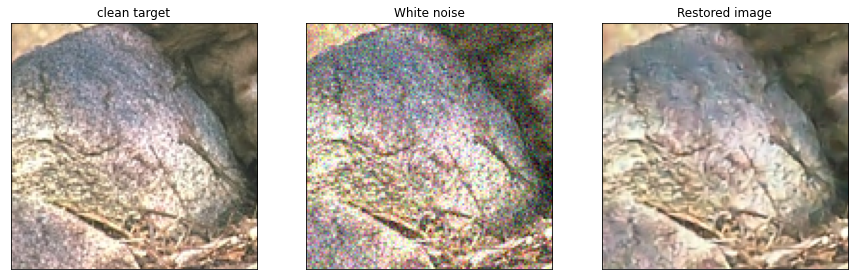

sample example on Kodak test set --------------------------------------------------


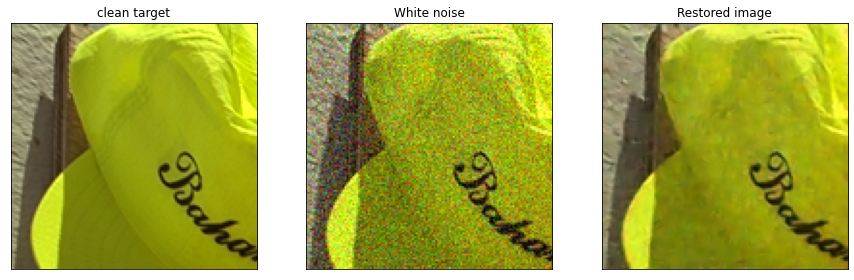

sample example on Set14 test set --------------------------------------------------


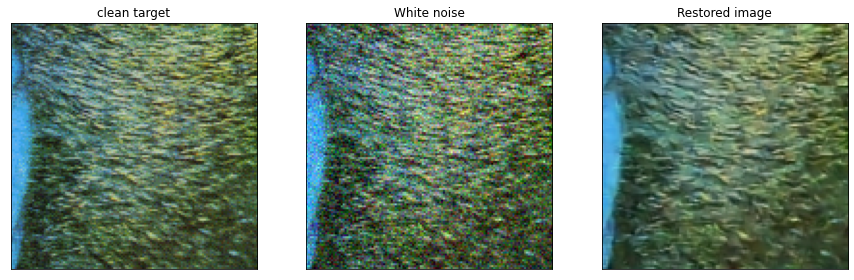

history is loaded


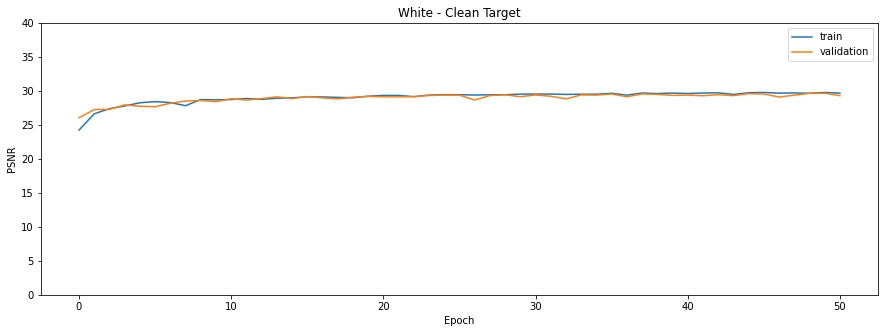

In [191]:
noise_dic = {'bernoulli': bernoulli_noise,
             'impulse': impulse_noise,
             'poisson': poisson_noise,
             'text': text_noise,
             'white': white_noise}
for name_folder in os.listdir("Models/"):
    print("############################################################################")
    noise_type, noisy = name_folder.split("_")[0:2]
    is_target_noisy = (noisy == 'noisy')
#     print(noise_type, is_target_noisy)
    model_path = [x for x in os.listdir("Models/" + name_folder) if x.endswith(".hdf5")]
    history_path = [x for x in os.listdir("Models/" + name_folder) if x.endswith(".csv")]
    t_BSD_path = gen_tfrecords(t_dir_BSD, 2,  noise_dic[noise_type], name = "BSD300", prefix=noise_type, mode = 'test' , force_gen=ReGen)
    t_KDK_path = gen_tfrecords(t_dir_KDK, 8,  noise_dic[noise_type], name = "Kodak",  prefix=noise_type, mode = 'test' , force_gen=ReGen)
    t_S14_path = gen_tfrecords(t_dir_S14, 13, noise_dic[noise_type], name = "Set14",  prefix=noise_type, mode = 'test' , force_gen=ReGen)
    tfrecord_BSD = tf.data.TFRecordDataset(t_BSD_path)
    tfrecord_KDK = tf.data.TFRecordDataset(t_KDK_path)
    tfrecord_S14 = tf.data.TFRecordDataset(t_S14_path)
    t_BSD = tfrecord_BSD.map(read_tfrecord).batch(4)
    t_KDK = tfrecord_KDK.map(read_tfrecord).batch(4)
    t_S14 = tfrecord_S14.map(read_tfrecord).batch(4)
    if len(model_path) > 0:
        model = tf.keras.models.load_model("Models/" + name_folder + "/" + model_path[-1], custom_objects={'PSNR': PSNR, 'bernoulli_loss': bernoulli_loss})
        print("#################"+"model {} loaded".format(noise_type.capitalize() + " with " + (' noisy ' if is_target_noisy else ' clean ') + "target") + "#################")
        print("\nmodel evaluated on BSDS300:", model.evaluate(t_BSD))
        print("\nmodel evaluated on Kodak:", model.evaluate(t_KDK))
        print("\nmodel evaluated on Set14:", model.evaluate(t_S14))
        print('sample example on BSDS300 test set --------------------------------------------------')
        fig, ax = plt.subplots(1,3, figsize = (15, 5))
        for cor, img in t_BSD.shuffle(10).unbatch():
            break
        ax[0].imshow(img)
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].set_title("clean target")


        ax[1].imshow(cor)
        ax[1].set_xticks([])
        ax[1].set_yticks([])
        ax[1].set_title(noise_type.capitalize() + ' noise')

        pred = model(cor.numpy().reshape([1] + img_shape)).numpy().reshape(img_shape)
        ax[2].imshow(pred)
        ax[2].set_xticks([])
        ax[2].set_yticks([])
        ax[2].set_title('Restored image')
        plt.show(block=False)
        
        print('sample example on Kodak test set --------------------------------------------------')
        fig, ax = plt.subplots(1,3, figsize = (15, 5))
        for cor, img in t_KDK.shuffle(10).unbatch():
            break
        ax[0].imshow(img)
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].set_title("clean target")


        ax[1].imshow(cor)
        ax[1].set_xticks([])
        ax[1].set_yticks([])
        ax[1].set_title(noise_type.capitalize() + ' noise')

        pred = model(cor.numpy().reshape([1] + img_shape)).numpy().reshape(img_shape)
        ax[2].imshow(pred)
        ax[2].set_xticks([])
        ax[2].set_yticks([])
        ax[2].set_title('Restored image')
        plt.show(block=False)
        print('sample example on Set14 test set --------------------------------------------------')
        fig, ax = plt.subplots(1,3, figsize = (15, 5))
        for cor, img in t_S14.shuffle(10).unbatch():
            break
        ax[0].imshow(img)
        ax[0].set_xticks([])
        ax[0].set_yticks([])
        ax[0].set_title("clean target")


        ax[1].imshow(cor)
        ax[1].set_xticks([])
        ax[1].set_yticks([])
        ax[1].set_title(noise_type.capitalize() + ' noise')

        pred = model(cor.numpy().reshape([1] + img_shape)).numpy().reshape(img_shape)
        ax[2].imshow(pred)
        ax[2].set_xticks([])
        ax[2].set_yticks([])
        ax[2].set_title('Restored image')
        plt.show(block=False)
        
        
    else:
        print("No model file is found")
    if len(history_path) > 0:
        history = pd.read_csv("Models/" + name_folder + "/" + history_path[-1])
        print("history is loaded")
        plt.figure(figsize = (15, 5))
        plt.plot(history[['PSNR', 'val_PSNR']])
        plt.ylim(0, 40)
        plt.legend(['train','validation'])
        plt.xlabel('Epoch')
        plt.ylabel('PSNR')
        plt.title(noise_type.capitalize() + (" - Noisy Target" if is_target_noisy else " - Clean Target"))
        plt.show( block=False )
    else:
        print("No history file is found")
